## Introduction

This Notebook showcase few of the **Gaussians Mixture model** or GMM.


In [ ]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
import seaborn as sns

%matplotlib inline

# We will use the Peterson and Barney’s dataset of vowel formant frequencies.

More specifically, Peterson and Barney measured the fundamental frequency $F0$ and the first three formant frequencies ($F1-F3$) of sustained English Vowels, using samples from various speakers.

In [ ]:
from google.colab import files
files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

Saving PB_data.npy to PB_data.npy


In [ ]:
data

array({'f3': array([2850, 2790, 2640, ..., 3380, 2160, 2200], dtype=uint16), 'f2': array([2280, 2400, 2030, ..., 1140, 1850, 1830], dtype=uint16), 'f1': array([240, 280, 390, ..., 500, 740, 660], dtype=uint16), 'f0': array([160, 186, 203, ..., 334, 308, 328], dtype=uint16), 'phoneme_id': array([ 1,  1,  2, ...,  9, 10, 10], dtype=uint8)},
      dtype=object)

The dataset contains 4 vectors ($F0-F3$), containing the fundamental frequencies ($F0$, $F1$, $F2$ and $F3$) for each phoneme and another vector “phoneme\_id” containing a number representing the id of the phoneme.

We will use only the dataset associated with formants $F1$ and $F2$.

**Note**: Phonemes and Frequencies are two different things; phoneme_id is the ground truth class of each row while frequencies represent features of each data point.

In [ ]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

### The Plot of $F1$ against $F2$. (You should be able to spot some clusters already in this scatter plot).

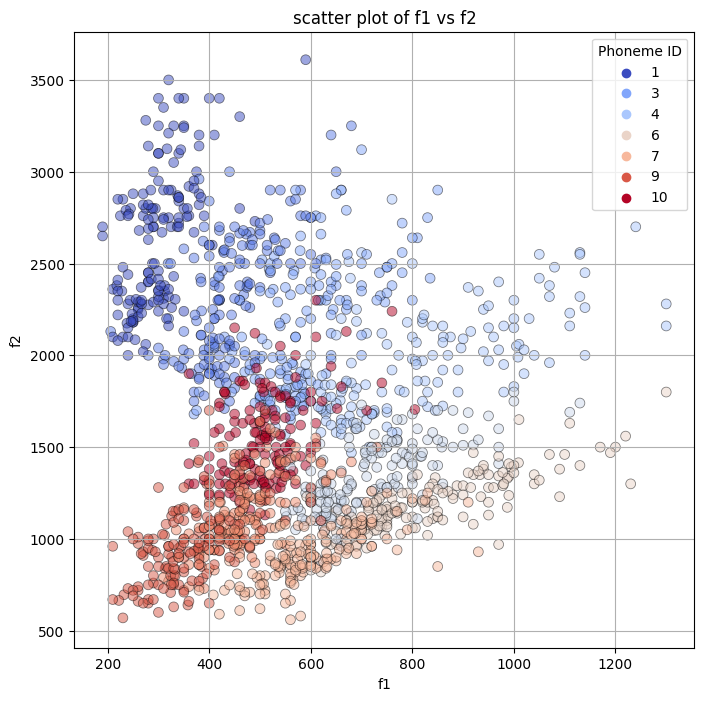

In [ ]:
### your code here
#data variables - f1,f2,phoneme_id

plt.figure(figsize=(8, 8))
sns.scatterplot(x=f1, y=f2, hue=phoneme_id, palette='coolwarm', alpha=0.5, edgecolor='k', marker='o', s=50)
plt.title('scatter plot of f1 vs f2')
plt.grid(True)
plt.legend(title='Phoneme ID')
plt.ylabel('f2')
plt.xlabel('f1')
plt.show()

# 1. GMM Using the (Expectation — Maximization)EM algorithm

Recall the following definition of a Gaussians Mixture Model. Assuming our observed random vector is $\mathbf{x}\in\mathbb{R}^D$, a GMM models $p(\mathbf{x})$ as a sum of $K$-many weighted Gaussians. More specifically:


\begin{equation}
 p(\mathbf{x}) = \sum_{k=1}^K \frac{p(c_{k})}{(2\pi)^{D/2} \mathrm{det}\left(\boldsymbol\Sigma_k\right)^{1/2}}
 % \exp(-\frac{1}{2}(x-\mu)^T \sum_{k}^{-1}(x-\mu))
 \exp\left(-\frac{1}{2}(\mathbf{x}-\boldsymbol\mu_k)^\top {\boldsymbol\Sigma_k}^{-1}(\mathbf{x}-\boldsymbol\mu_k)\right),
\end{equation}
where:
* $\boldsymbol\mu_k\in\mathbb{R}^{D}$
* $\boldsymbol\Sigma_{k}\in\mathbb{R}^{D\times D}$
* $p(c_{k})=\pi_k\in\mathbb{R}$


denote the $k$-th gaussian component's **mean vector**, **covariance matrix**, and **mixture coefficients** respectively. The $K$-many gaussian components' model parameters are referred to collectively as $\theta = \{\boldsymbol\mu_k,\boldsymbol\Sigma_{k},\pi_k\}_{k=1}^K$.

## EM Algorithm
For the E step we softly assign each datum to the closest centroid (using the current iteration's fixed model parameters) as in the K-means example.

For the M step we update the model parameters $\theta$ to maximize the weighted log-likelihood.
At a high level, for each centroid k we:
* Update the mean vectors
* Update the covariance matrices (We will fit Gaussians with diagonal covariance matrices)
* Set the mixture coefficients as the mean probability of a sample being generated by the k-th gaussian component

In [ ]:
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
	return Z


### Defining Helper functions

In [1]:
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):

        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]

            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='.', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

## Training GMM

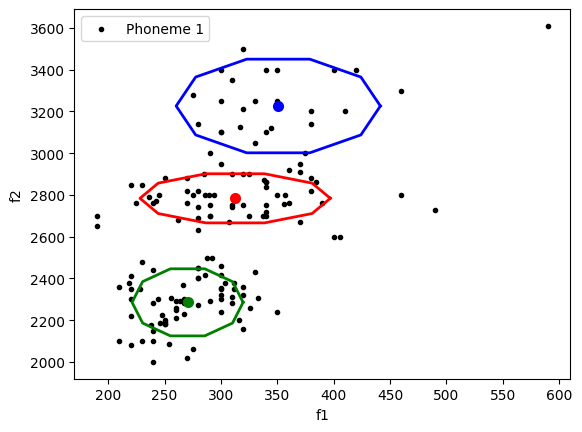


Finished.

[[ 312.59113 2783.8975 ]
 [ 270.3952  2285.4653 ]
 [ 350.8445  3226.3367 ]] [[[ 3562.59932446     0.        ]
  [    0.          7657.77955881]]

 [[ 1213.7384142      0.        ]
  [    0.         14278.4204489 ]]

 [[ 4102.861235       0.        ]
  [    0.         27830.2552059 ]]]


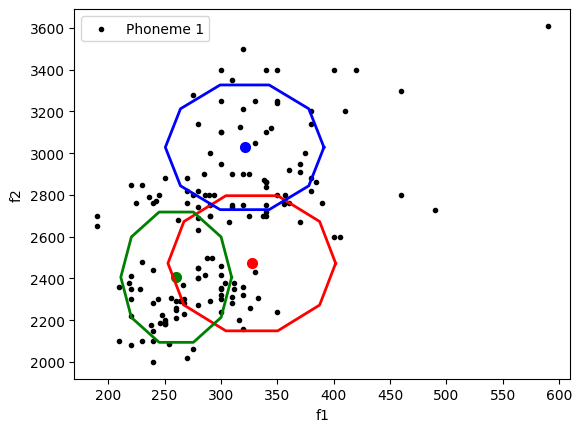

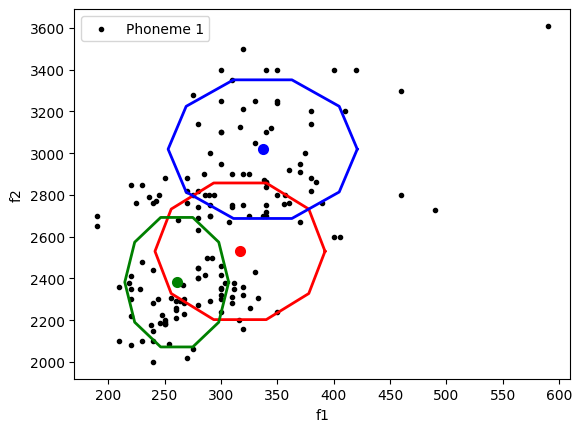

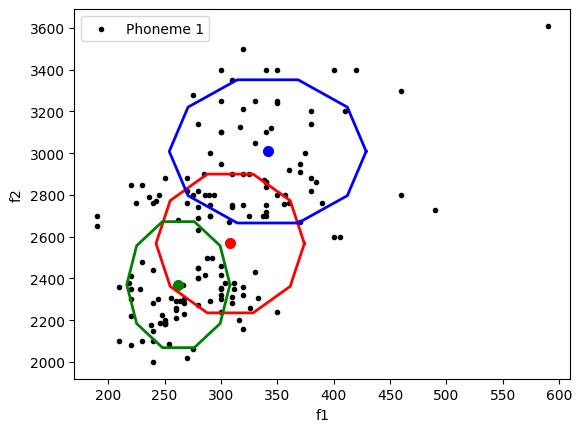

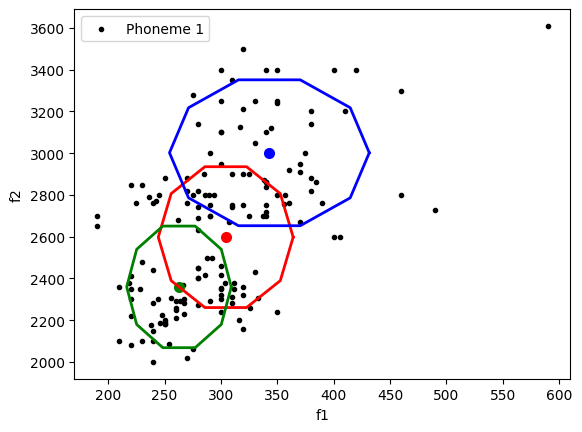

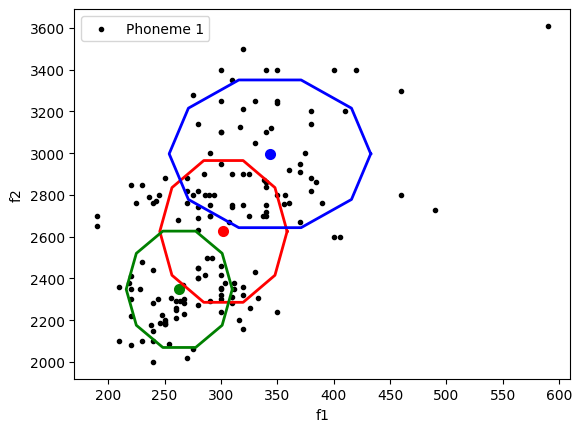

...

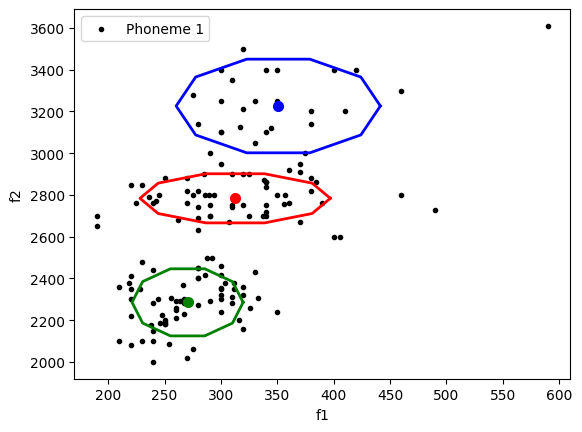

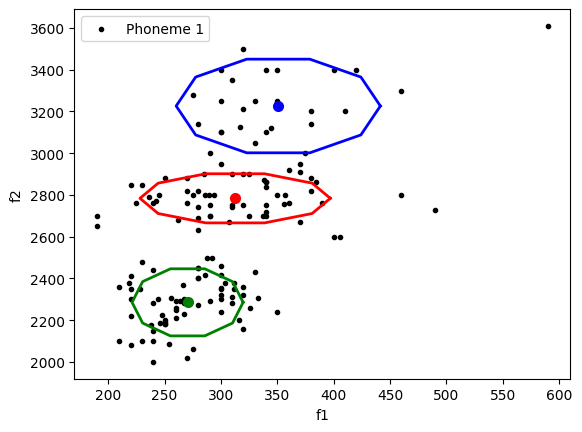

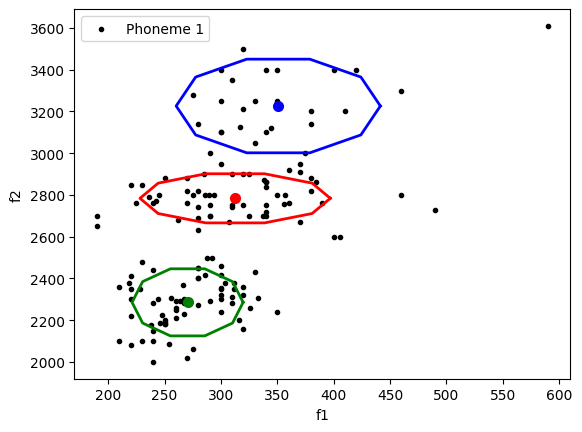

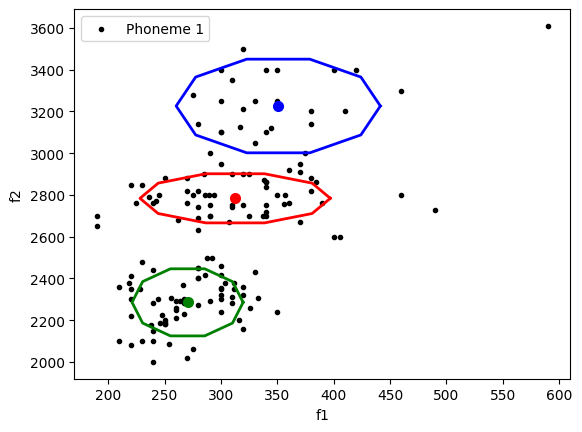

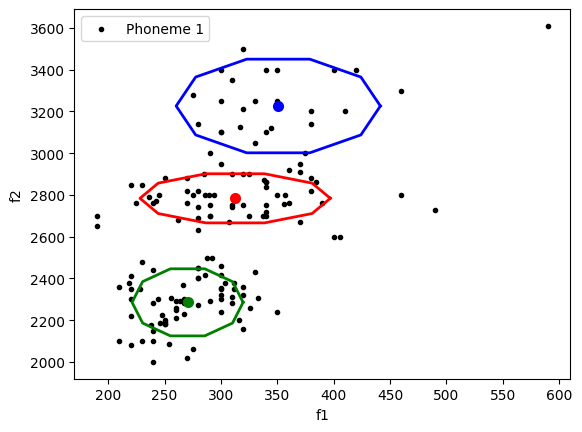

In [ ]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)


*   Running the code multiple times for $K=3$
*   Repeating the training for phoneme_id = 2  and saved the parameters
*   Repeating the training for $K=6$ for phoneme_id =1 and phoneme_id=2 and saved the model parameters


# Saving the GMM model.

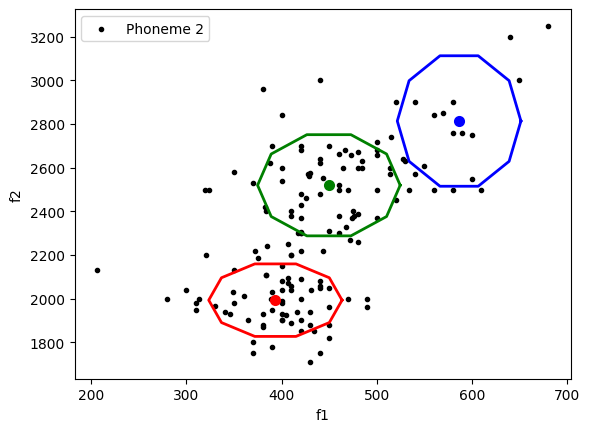


Finished.

[[ 393.45297 1993.0835 ]
 [ 449.67694 2519.6885 ]
 [ 586.5651  2814.1875 ]] [[[ 2454.90457699     0.        ]
  [    0.         15263.87668615]]

 [[ 2809.39524112     0.        ]
  [    0.         29720.09934166]]

 [[ 2111.47529543     0.        ]
  [    0.         49424.40612296]]]


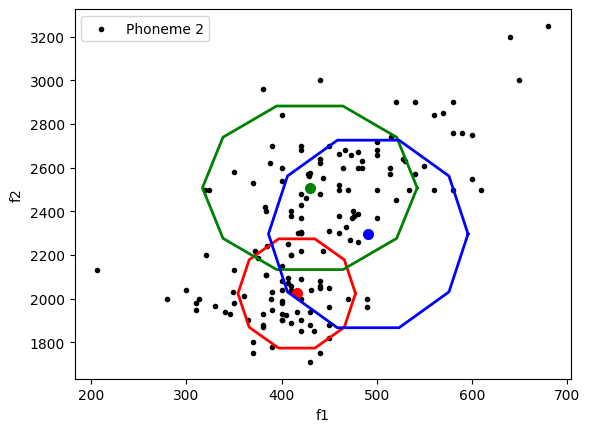

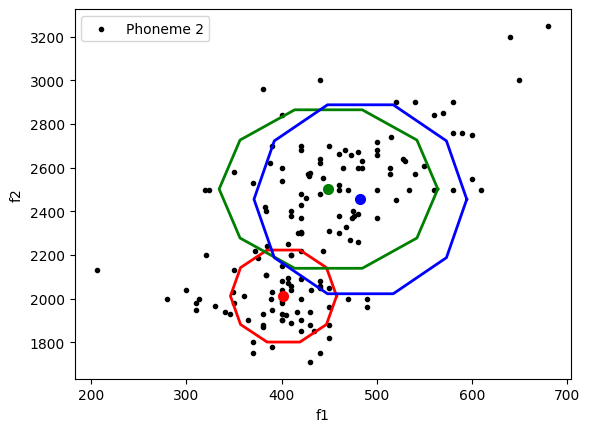

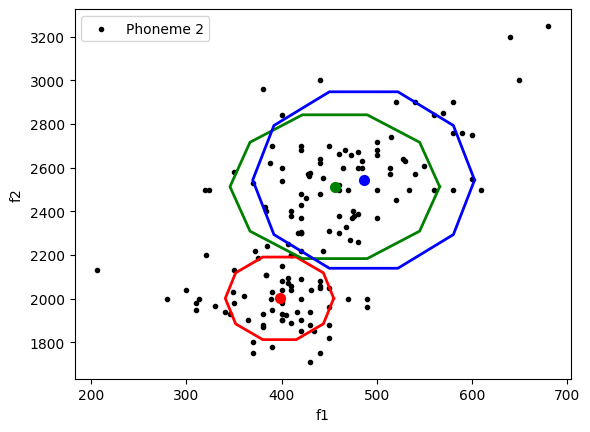

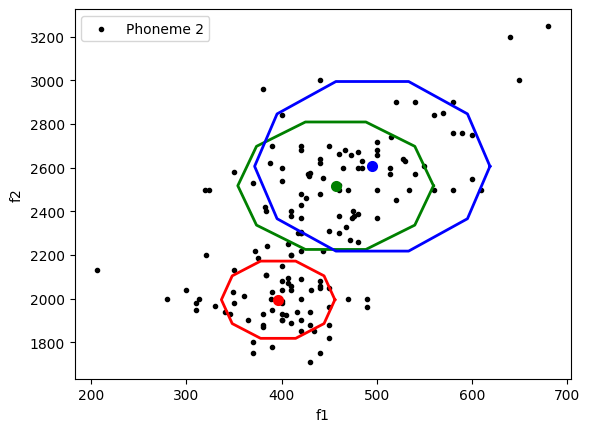

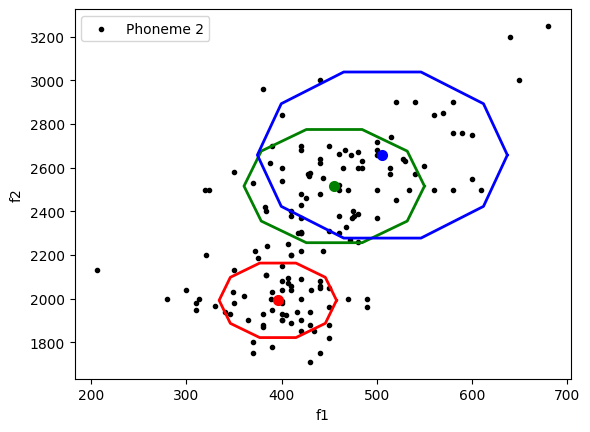

...

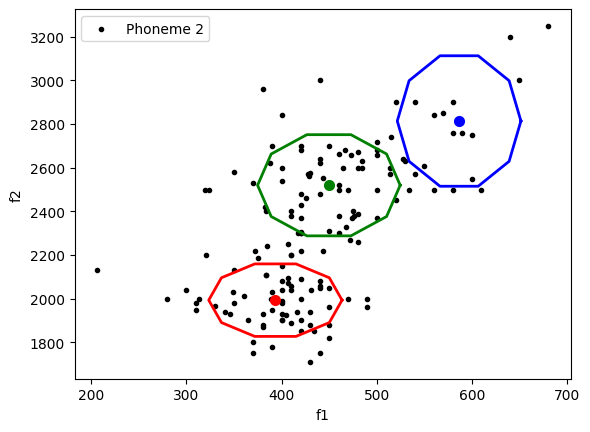

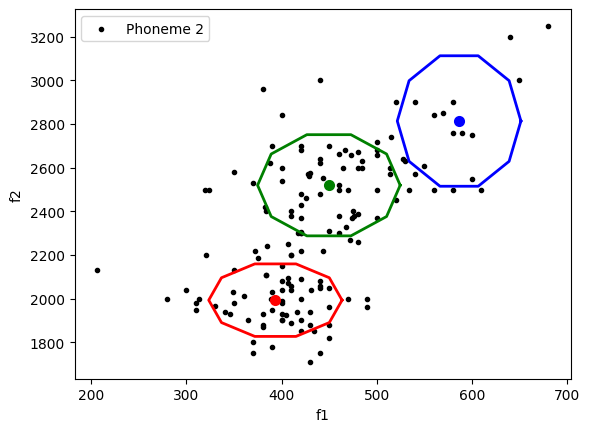

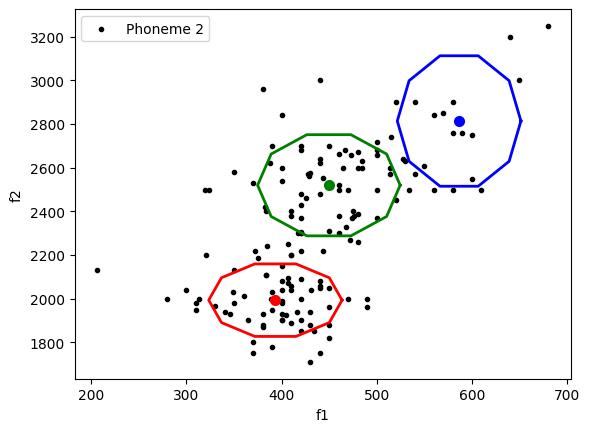

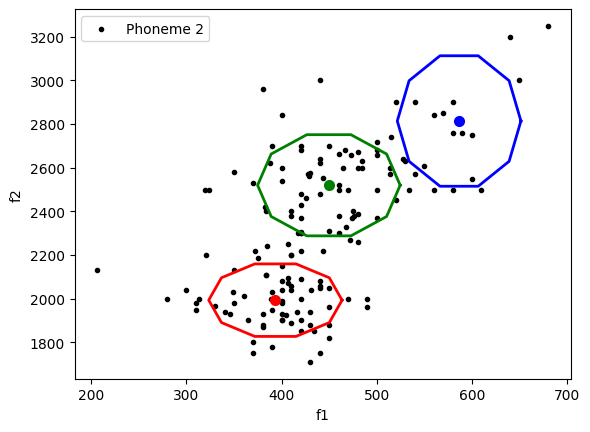

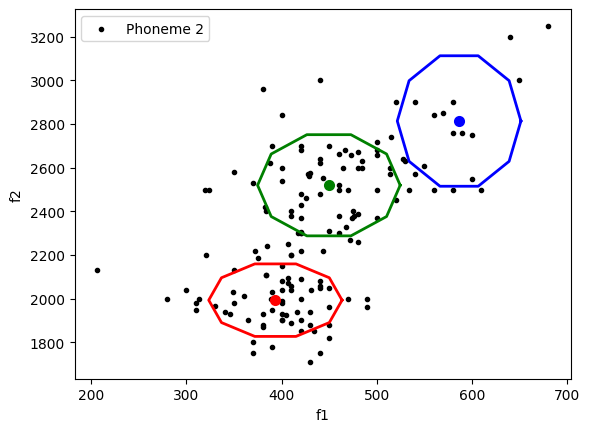

In [ ]:
### your code here
# k =3 , p_id = 2
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

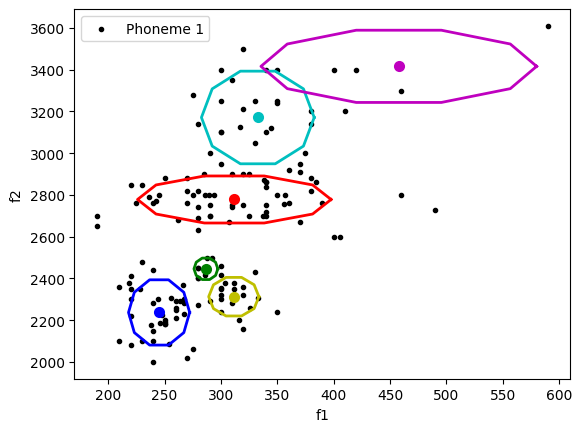


Finished.

[[ 311.8543  2778.342  ]
 [ 286.65182 2446.0862 ]
 [ 245.11943 2237.088  ]
 [ 332.71252 3171.2979 ]
 [ 457.76495 3416.375  ]
 [ 311.38663 2312.6072 ]] [[[ 3685.58819852     0.        ]
  [    0.          7020.9429193 ]]

 [[   56.12213639     0.        ]
  [    0.          1460.31465039]]

 [[  367.83554924     0.        ]
  [    0.         13514.10386141]]

 [[ 1251.41745073     0.        ]
  [    0.         27228.43877277]]

 [[ 7475.37724157     0.        ]
  [    0.         16553.5703001 ]]

 [[  248.32470876     0.        ]
  [    0.          4718.65418189]]]


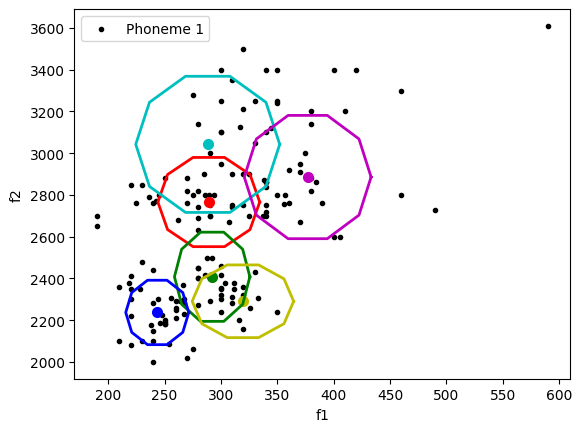

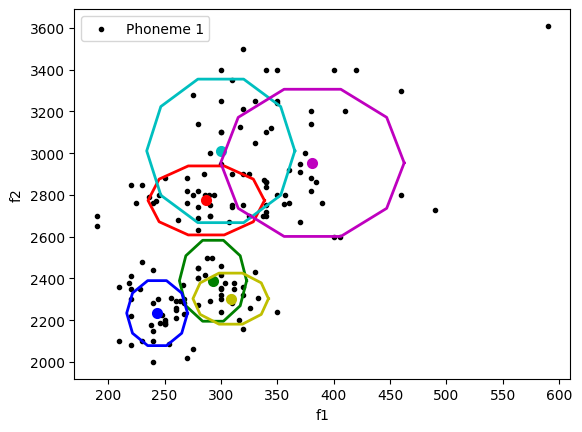

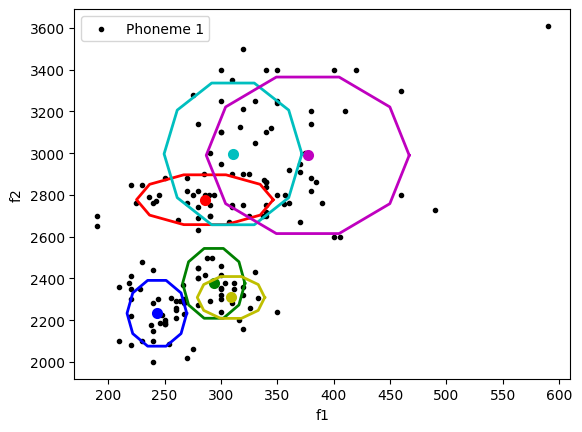

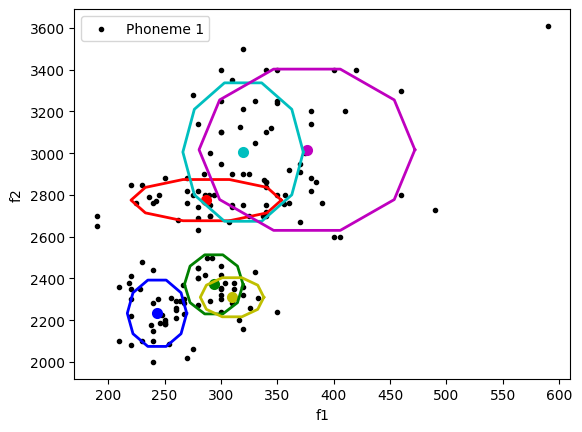

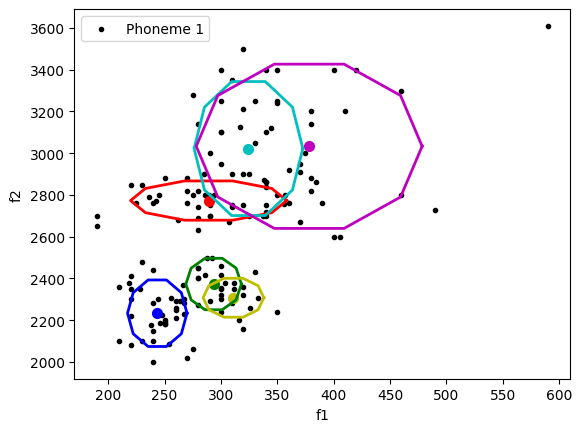

...

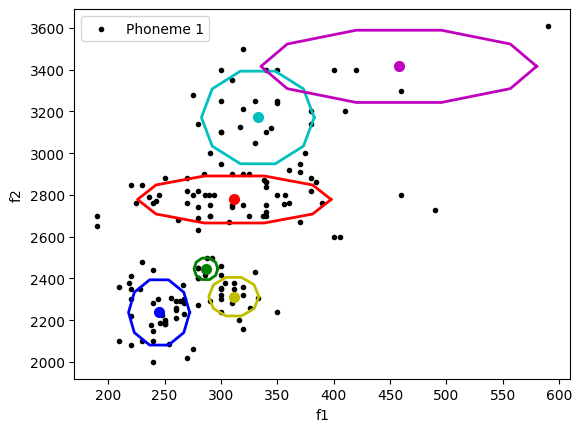

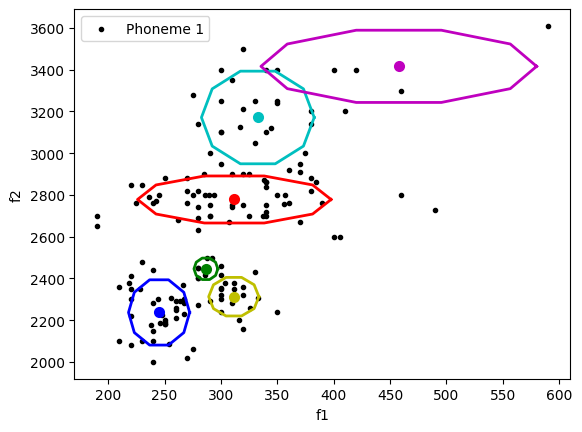

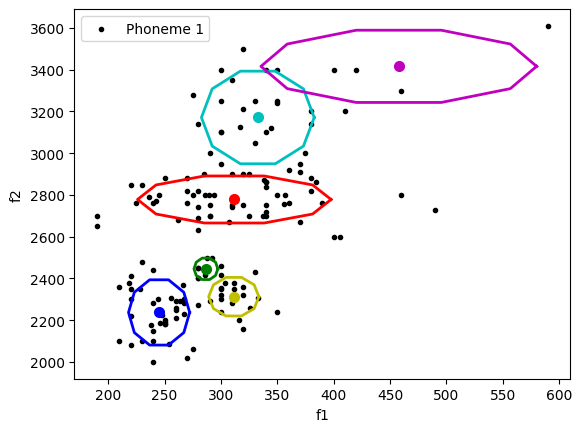

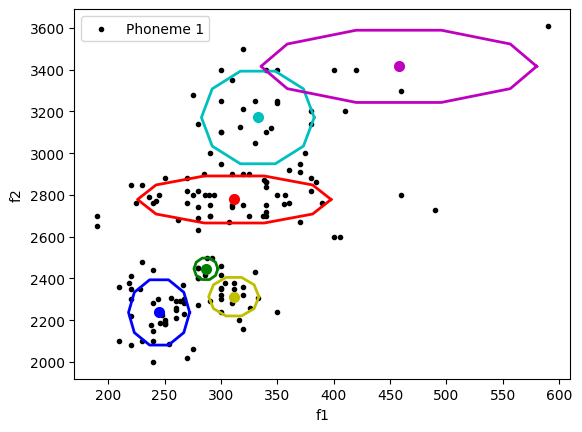

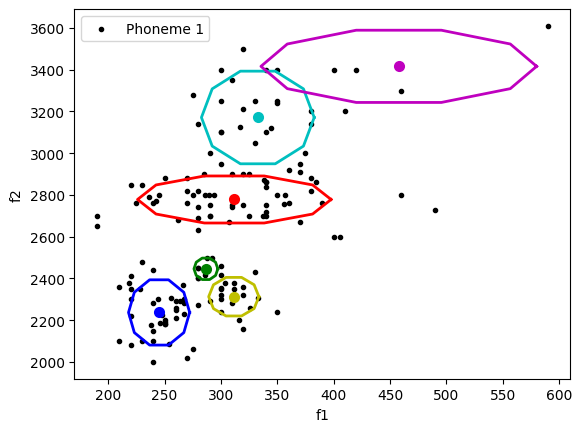

In [ ]:
### your code here
# k =6 , p_id = 1

k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

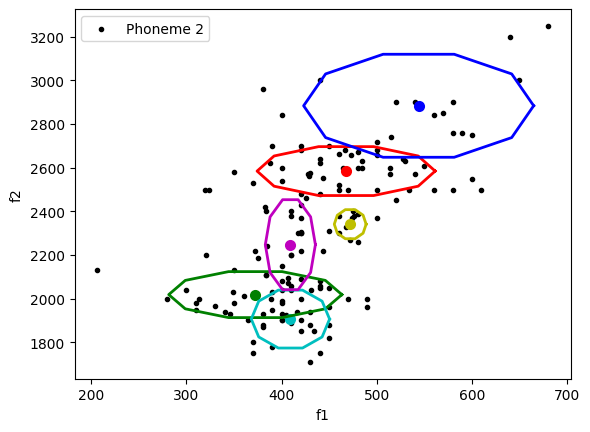


Finished.

[[ 467.80423 2584.6433 ]
 [ 372.33502 2018.5133 ]
 [ 544.0376  2884.0752 ]
 [ 409.2468  1906.3715 ]
 [ 409.17224 2247.3281 ]
 [ 472.09915 2341.242  ]] [[[ 4381.29089764     0.        ]
  [    0.          6942.20692857]]

 [[ 4140.93448902     0.        ]
  [    0.          6138.96661158]]

 [[ 7309.40944058     0.        ]
  [    0.         30801.5411219 ]]

 [[  847.38026144     0.        ]
  [    0.          9733.91686049]]

 [[  346.73652583     0.        ]
  [    0.         23506.67950879]]

 [[  140.27714079     0.        ]
  [    0.          2453.86329623]]]


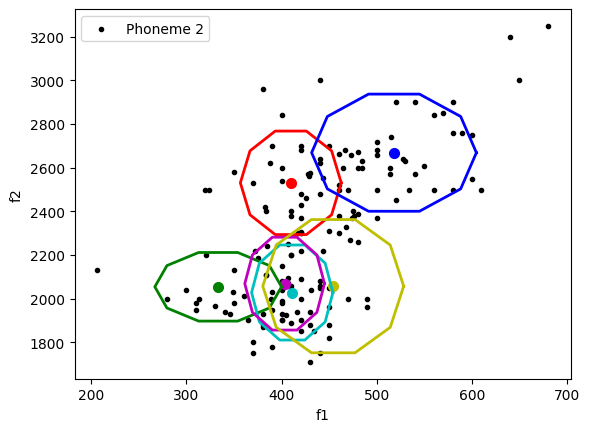

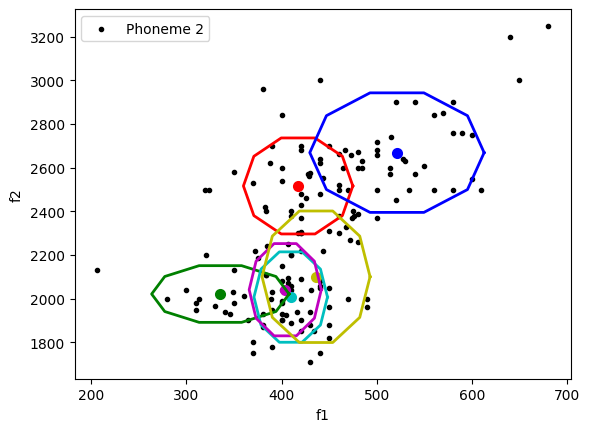

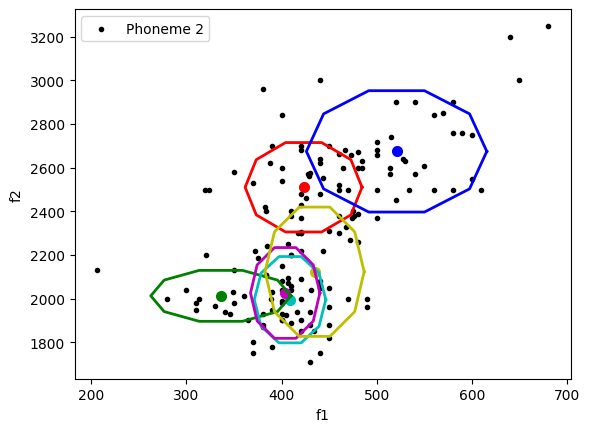

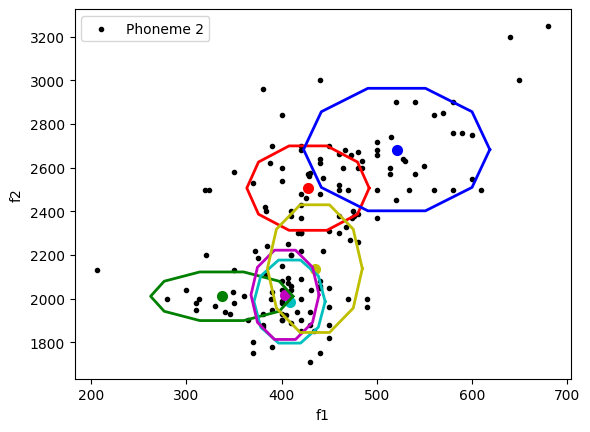

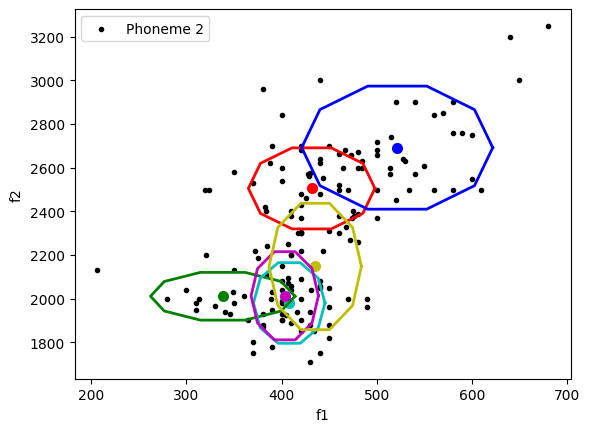

...

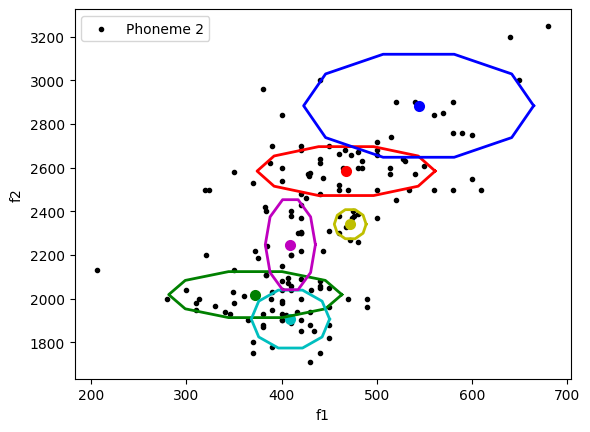

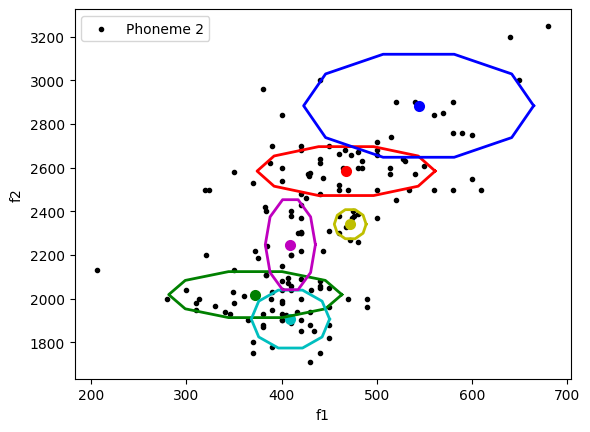

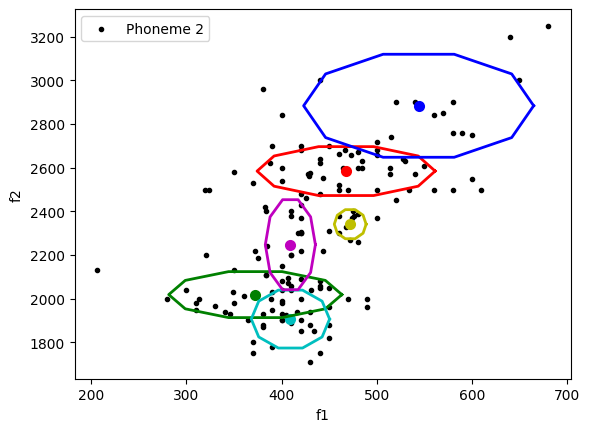

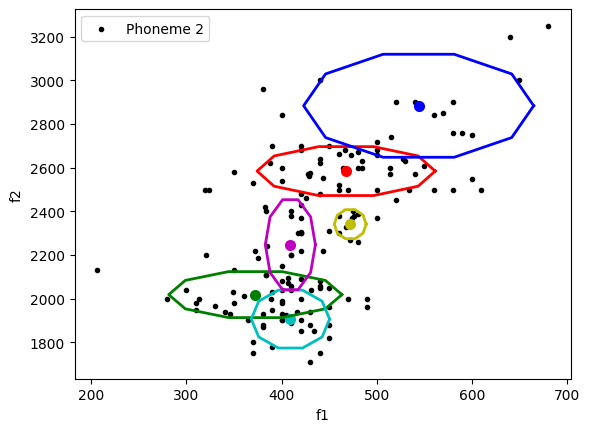

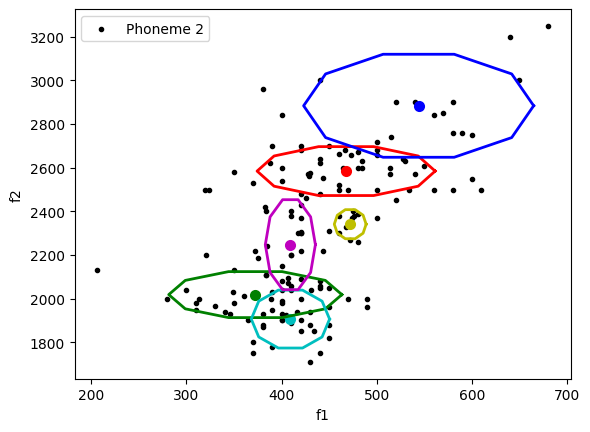

In [ ]:
### your code here
# k =6 , p_id = 2
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

### Use two GMM trained above ($K=3$) to build a classifier to discriminate between phonemes 1 and 2.

Classify using the Maximum Likelihood (ML) criterion and calculate the miss-classification error.

**Note: - Remember that a classification under the ML compares $p(\mathbf{x};\boldsymbol\theta_{1})$, where $\boldsymbol\theta_{1}$ are the parameters of the GMM learnt for the first phoneme, with $p(\mathbf{x};\boldsymbol\theta_{2})$, where $\boldsymbol\theta_{2}$  are the parameters of the MoG learnt for the second phoneme.**

In [2]:
k = 3
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
Z_phoneme_1 = get_predictions(mu, s, p, X)


# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
###your code here
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise Exception('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

Z_phoneme_2 = get_predictions(mu, s, p, X)  # shape Nxk

# classify each point using Maximum Likelihood


### your code here
sum_likelihood_phoneme_1 = np.sum(Z_phoneme_1, axis=1)
sum_likelihood_phoneme_2 = np.sum(Z_phoneme_2, axis=1)
predictions = np.argmax(np.vstack((sum_likelihood_phoneme_1, sum_likelihood_phoneme_2)), axis=0) + 1


# calculate accuracy
### your code here
true_labels = phoneme_id[inds_1_and_2]
acc = np.sum(predictions == true_labels) / len(true_labels)
mc_error = 1 - acc

print(f"accuracy: {acc*100:.2f}%")
print(f"miss classification error: {mc_error*100:.2f}%")




NameError: name 'np' is not defined

### Repeat the process for $K=6$ and compare the results in terms of accuracy.



In [ ]:
k = 6
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
Z_phoneme_1 = get_predictions(mu, s, p, X)



# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
###your code here
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise Exception('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

Z_phoneme_2 = get_predictions(mu, s, p, X)  # shape Nxk

# classify each point using Maximum Likelihood


### your code here
summed_likelihoods_phoneme_1 = np.sum(Z_phoneme_1, axis=1)
summed_likelihoods_phoneme_2 = np.sum(Z_phoneme_2, axis=1)
predictions_k6 = np.argmax(np.vstack((summed_likelihoods_phoneme_1, summed_likelihoods_phoneme_2)), axis=0) + 1


# calculate accuracy
### your code here
true_labels = phoneme_id[inds_1_and_2]
acc = np.sum(predictions_k6 == true_labels) / len(true_labels)
mc_error = 1 - acc

print(f"accuracy: {acc*100:.2f}%")
print(f"miss classification error: {mc_error*100:.2f}%")

accuracy: 96.38%
miss classification error: 3.62%


Report Analysis for K=3 

Confusion matrix


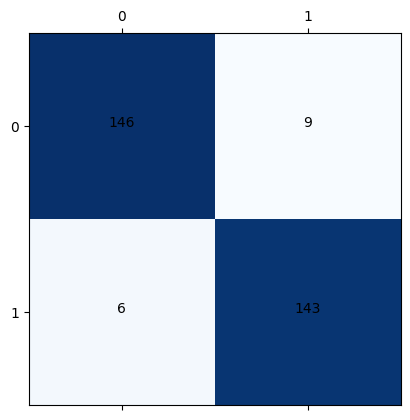


Accuracy Score : 95.06579%  , Recall Score : 96.05263% , Precision Score : 94.19355% , F1 Score : 95.11401% 

Report Analysis for K=6 

Confusion matrix


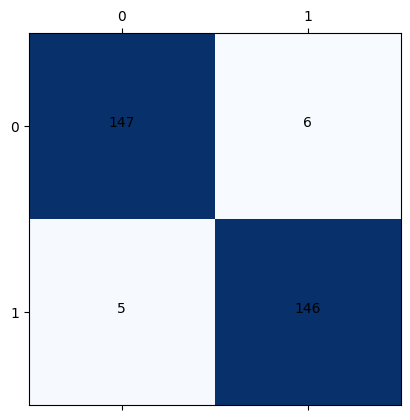


Accuracy Score : 96.38158%  , Recall Score : 96.71053% , Precision Score : 96.07843% , F1 Score : 96.39344% 



In [ ]:
from sklearn.metrics import accuracy_score , precision_score ,recall_score , f1_score , confusion_matrix


# function to display confusion matrix
def showConfMat(CM, labels = ['0','1']):
  plt.matshow(CM,cmap='Blues')
  for i in range(CM.shape[0]):
    for j in range(CM.shape[1]):
      plt.text(i,j,CM[i,j].round(2),ha='center',)
  plt.xticks([0,1],labels)
  plt.yticks([0,1],labels)
  plt.show()

print('Report Analysis for K=3 \n')

acc_score_3 = accuracy_score(true_labels, predictions )
recall_score_3 = recall_score(true_labels, predictions )
prec_score_3 = precision_score(true_labels, predictions )
f1_score_3 = f1_score(true_labels, predictions )
confusion_matrix_3 = confusion_matrix(true_labels,predictions)
print("Confusion matrix")
showConfMat(confusion_matrix_3)

print(f"\nAccuracy Score : {acc_score_3*100:.5f}%  , Recall Score : {recall_score_3*100:.5f}% , Precision Score : {prec_score_3*100:.5f}% , F1 Score : {f1_score_3*100:.5f}% \n" )


print('Report Analysis for K=6 \n')
acc_score_6 = accuracy_score(true_labels, predictions_k6 )
recall_score_6 = recall_score(true_labels, predictions_k6 )
prec_score_6 = precision_score(true_labels, predictions_k6 )
f1_score_6 = f1_score(true_labels, predictions_k6 )
confusion_matrix_6 = confusion_matrix(true_labels,predictions_k6)
print("Confusion matrix")

showConfMat(confusion_matrix_6)

print(f"\nAccuracy Score : {acc_score_6*100:.5f}%  , Recall Score : {recall_score_6*100:.5f}% , Precision Score : {prec_score_6*100:.5f}% , F1 Score : {f1_score_6*100:.5f}% \n" )


### Display a "classification matrix" assigning labels to a grid of all combinations of the $F1$ and $F2$ features for the $K=3$ classifiers from above. Next, repeat this step for $K=6$ and compare the two.

Creating a custom uniform grid of points that spans all possible intermediate combinations of $F1$ and $F2$ features, using the features' minimum and maximum values as the limits. Classify each point in the grid using one of your classifiers. That is, create a classification matrix, $\mathbf{M}$, whose elements are either 0 or 1. $M(i,j)$ is 0 if the point at location $(i,j)$ on the custom grid is classified as belonging to phoneme 1, and is 1 otherwise.


f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


<Figure size 640x480 with 0 Axes>

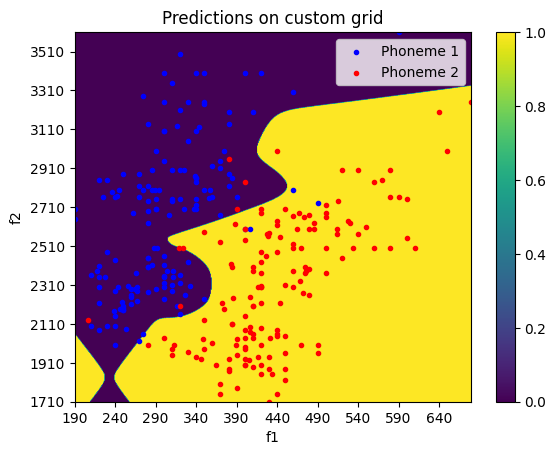

In [ ]:
k = 3

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
# Do predictions, using GMM trained on phoneme 2, on custom grid
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

f1_values = np.linspace(min_f1, max_f1, N_f1)
f2_values = np.linspace(min_f2, max_f2, N_f2)
f1_grid, f2_grid = np.meshgrid(f1_values, f2_values)
grid_points = np.zeros((N_f1 * N_f2, 2))
n = 0
for i in range(min_f1, max_f1):
    for j in range(min_f2, max_f2):
        grid_points[n, 0] = i
        grid_points[n, 1] = j
        n += 1

Z_grid_phoneme_1 = get_predictions(GMM_parameters_phoneme_1['mu'], GMM_parameters_phoneme_1['s'], GMM_parameters_phoneme_1['p'], grid_points)

Z_grid_phoneme_2 = get_predictions(GMM_parameters_phoneme_2['mu'], GMM_parameters_phoneme_2['s'], GMM_parameters_phoneme_2['p'], grid_points)

Z_grid_phoneme_1 = np.sum(Z_grid_phoneme_1, axis = 1)
Z_grid_phoneme_2 = np.sum(Z_grid_phoneme_2, axis = 1)

M = np.zeros((N_f1, N_f2))

for i in range(N_f1 * N_f2):
    x = int(i / N_f2)
    y = i % N_f2
    if Z_grid_phoneme_1[i] > Z_grid_phoneme_2[i]:
        M[x, y] = 0.0
    else:
        M[x, y] = 1.0

M = np.transpose(M)

################################################
# Visualize predictions on custom grid

# Create a figure
fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='blue', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='red', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


<Figure size 640x480 with 0 Axes>

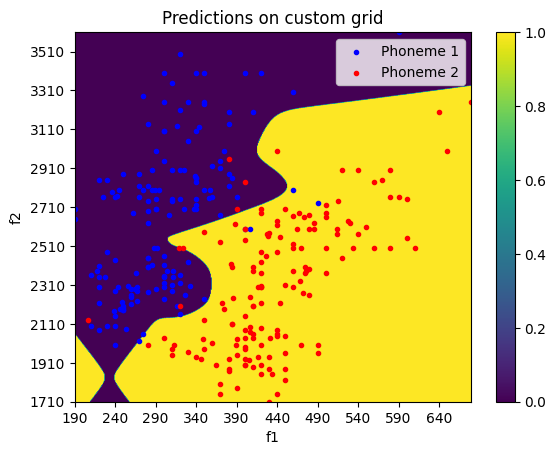

In [ ]:
k = 6

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1_6 = int(np.min(X[:,0]))
max_f1_6 = int(np.max(X[:,0]))
min_f2_6 = int(np.min(X[:,1]))
max_f2_6 = int(np.max(X[:,1]))
N_f1_6 = max_f1_6 - min_f1_6
N_f2_6 = max_f2_6 - min_f2_6
print('f1 range: {}-{} | {} points'.format(min_f1_6, max_f1_6, N_f1_6))
print('f2 range: {}-{} | {} points'.format(min_f2_6, max_f2_6, N_f2_6))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
# Do predictions, using GMM trained on phoneme 2, on custom grid
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

f1_6_values = np.linspace(min_f1_6, max_f1_6, N_f1_6)
f2_6_values = np.linspace(min_f2_6, max_f2_6, N_f2_6)
f1_6_grid, f2_6_grid = np.meshgrid(f1_6_values, f2_6_values)
grid_points_6 = np.zeros((N_f1_6 * N_f2_6, 2))
n = 0
for i in range(min_f1_6, max_f1_6):
    for j in range(min_f2_6, max_f2_6):
        grid_points_6[n, 0] = i
        grid_points_6[n, 1] = j
        n += 1

Z_grid_phoneme_1_6 = get_predictions(GMM_parameters_phoneme_1['mu'], GMM_parameters_phoneme_1['s'], GMM_parameters_phoneme_1['p'], grid_points_6)

Z_grid_phoneme_2_6 = get_predictions(GMM_parameters_phoneme_2['mu'], GMM_parameters_phoneme_2['s'], GMM_parameters_phoneme_2['p'], grid_points_6)

Z_grid_phoneme_1_6 = np.sum(Z_grid_phoneme_1_6, axis = 1)
Z_grid_phoneme_2_6 = np.sum(Z_grid_phoneme_2_6, axis = 1)

M_6 = np.zeros((N_f1_6, N_f2_6))

for i in range(N_f1_6 * N_f2_6):
    x = int(i / N_f2_6)
    y = i % N_f2_6
    if Z_grid_phoneme_1_6[i] > Z_grid_phoneme_2_6[i]:
        M_6[x, y] = 0.0
    else:
        M_6[x, y] = 1.0

M_6 = np.transpose(M_6)

################################################
# Visualize predictions on custom grid

# Create a figure
fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M_6, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1_6))
plt.ylim((0, N_f2_6))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1_6, step=50)
x_strings = [str(x+min_f1_6) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2_6, step=200)
y_strings = [str(y+min_f2_6) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1_6, X[:N_samples, 1] - min_f2_6, marker='.', color='blue', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1_6, X[N_samples:, 1] - min_f2_6, marker='.', color='red', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

Creating a new dataset that will contain 3 columns, as follows:
\begin{equation}
    X = [F1, F2, F1+F2]
\end{equation}

### Try to fit a GMM model to the new data. What is the problem that we would observe?

Iteration 001/150
Iteration 002/150


<ipython-input-6-5c11a34e070c>:26: RuntimeWarning: divide by zero encountered in double_scalars
  Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))


ValueError: ignored

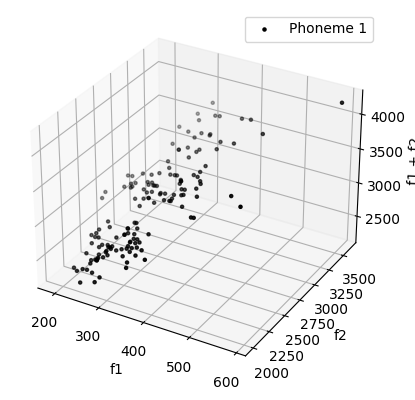

In [ ]:
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

X[:, 0] = f1 #f1 in the first column
X[:, 1] = f2 #f2 in the second column
X[:, 2] = f1 + f2   #f1+f2 in the third column
X = X[phoneme_id == p_id, :]


#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()

### Suggested ways to overcome the singularity problem and implement one of them. Show any training outputs.

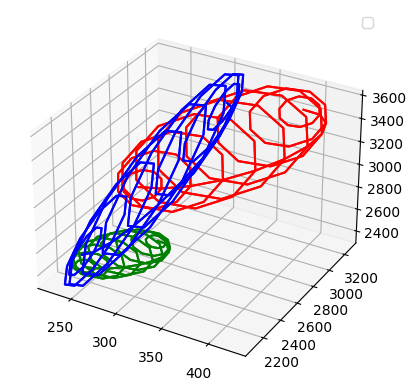

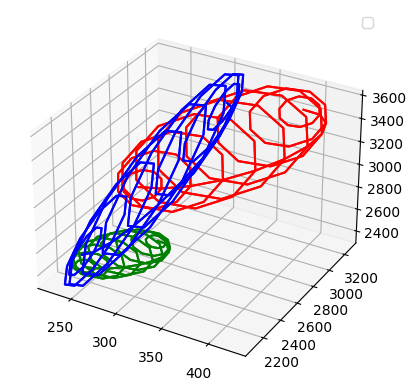

In [ ]:
#########################################
# Write your code here
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

X[:, 0] = f1 #f1 in the first column
X[:, 1] = f2 #f2 in the second column
X[:, 2] = f1 + f2 + np.random.normal(0, 1e-3, len(f1))  #f1+f2 in the third column
X = X[phoneme_id == p_id, :]


#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()